# Projet 7 - Implementation of a scoring model
# Notebook - Features interpretation & Data drift simulation

# Goal of the notebbok

1. First, make an analysis of the importance of the features over the predictions of the model (locally and globally).
2. Study the data drift of the new customer dataset compared with the train set then, make a simulation of the data drift which aims to determine a period of maintenance (Re-train/calibrate the model over the neww data profile) to maintain optimal model performances.

<h1>Table of Contents<span class="tocSkip"></span></h1>
<div class="toc"><ul class="toc-item"><li><span><a href="#Projet-7---Implementation-of-a-scoring-model" data-toc-modified-id="Projet-7---Implementation-of-a-scoring-model-1">Projet 7 - Implementation of a scoring model</a></span></li><li><span><a href="#Notebook---Features-interpretation-&amp;-Data-drift-simulation" data-toc-modified-id="Notebook---Features-interpretation-&amp;-Data-drift-simulation-2">Notebook - Features interpretation &amp; Data drift simulation</a></span></li><li><span><a href="#Goal-of-the-notebbok" data-toc-modified-id="Goal-of-the-notebbok-3">Goal of the notebbok</a></span></li><li><span><a href="#I)-Importation-of-the-dataset-into-a-pandas-dataframe" data-toc-modified-id="I)-Importation-of-the-dataset-into-a-pandas-dataframe-4">I) Importation of the dataset into a pandas dataframe</a></span><ul class="toc-item"><li><span><a href="#1)-Import-all-librairies-and-tools-required-to-realize-the-project-and-set-the-first-global-variables" data-toc-modified-id="1)-Import-all-librairies-and-tools-required-to-realize-the-project-and-set-the-first-global-variables-4.1">1) Import all librairies and tools required to realize the project and set the first global variables</a></span></li><li><span><a href="#2)-Settings-of-global-graphics-parameters" data-toc-modified-id="2)-Settings-of-global-graphics-parameters-4.2">2) Settings of global graphics parameters</a></span></li><li><span><a href="#3)-Global-files'-path" data-toc-modified-id="3)-Global-files'-path-4.3">3) Global files' path</a></span></li><li><span><a href="#4)-Importation-of-the-preprocessed-datasets" data-toc-modified-id="4)-Importation-of-the-preprocessed-datasets-4.4">4) Importation of the preprocessed datasets</a></span></li><li><span><a href="#3)-Extracting-the-explicatives" data-toc-modified-id="3)-Extracting-the-explicatives-4.5">3) Extracting the explicatives</a></span></li><li><span><a href="#4)-Loading-the-model" data-toc-modified-id="4)-Loading-the-model-4.6">4) Loading the model</a></span></li></ul></li><li><span><a href="#II)-Interpretations" data-toc-modified-id="II)-Interpretations-5">II) Interpretations</a></span><ul class="toc-item"><li><span><a href="#2-)-Global" data-toc-modified-id="2-)-Global-5.1">2 ) Global</a></span><ul class="toc-item"><li><span><a href="#a)-LightGBM-features-importance-function" data-toc-modified-id="a)-LightGBM-features-importance-function-5.1.1">a) LightGBM features importance function</a></span></li><li><span><a href="#b)-SHAP" data-toc-modified-id="b)-SHAP-5.1.2">b) SHAP</a></span><ul class="toc-item"><li><span><a href="#i.-Library-importation" data-toc-modified-id="i.-Library-importation-5.1.2.1">i. Library importation</a></span></li><li><span><a href="#ii.-SHAP-explanation" data-toc-modified-id="ii.-SHAP-explanation-5.1.2.2">ii. SHAP explanation</a></span></li><li><span><a href="#iii.-Save-the-explainer" data-toc-modified-id="iii.-Save-the-explainer-5.1.2.3">iii. Save the explainer</a></span></li><li><span><a href="#iv.-Interpretations" data-toc-modified-id="iv.-Interpretations-5.1.2.4">iv. Interpretations</a></span></li><li><span><a href="#v.-Save-global-interpretations" data-toc-modified-id="v.-Save-global-interpretations-5.1.2.5">v. Save global interpretations</a></span></li></ul></li></ul></li><li><span><a href="#2)-Local" data-toc-modified-id="2)-Local-5.2">2) Local</a></span><ul class="toc-item"><li><span><a href="#a)-SHAP" data-toc-modified-id="a)-SHAP-5.2.1">a) SHAP</a></span><ul class="toc-item"><li><span><a href="#i.-Show-customers-IDs-with-a-denied-recommendation" data-toc-modified-id="i.-Show-customers-IDs-with-a-denied-recommendation-5.2.1.1">i. Show customers IDs with a denied recommendation</a></span></li><li><span><a href="#ii.-SHAP-explanation" data-toc-modified-id="ii.-SHAP-explanation-5.2.1.2">ii. SHAP explanation</a></span></li><li><span><a href="#iii.-Interpretations" data-toc-modified-id="iii.-Interpretations-5.2.1.3">iii. Interpretations</a></span></li></ul></li></ul></li></ul></li><li><span><a href="#III)-Data-drift-analysis:-Evidently" data-toc-modified-id="III)-Data-drift-analysis:-Evidently-6">III) Data drift analysis: Evidently</a></span><ul class="toc-item"><li><span><a href="#1)-Additional-importation" data-toc-modified-id="1)-Additional-importation-6.1">1) Additional importation</a></span><ul class="toc-item"><li><span><a href="#a)-Libraries" data-toc-modified-id="a)-Libraries-6.1.1">a) Libraries</a></span></li><li><span><a href="#b)-Global-path" data-toc-modified-id="b)-Global-path-6.1.2">b) Global path</a></span></li></ul></li><li><span><a href="#2)-Functions" data-toc-modified-id="2)-Functions-6.2">2) Functions</a></span></li><li><span><a href="#3)-Data-drift-between-the-dataset-of-new-customers-and-the-train-set" data-toc-modified-id="3)-Data-drift-between-the-dataset-of-new-customers-and-the-train-set-6.3">3) Data drift between the dataset of new customers and the train set</a></span><ul class="toc-item"><li><span><a href="#a)-Evidently-report" data-toc-modified-id="a)-Evidently-report-6.3.1">a) Evidently report</a></span></li><li><span><a href="#b)-Report-storage" data-toc-modified-id="b)-Report-storage-6.3.2">b) Report storage</a></span></li><li><span><a href="#c)-SHAP-values-of-features-with-significant-data-drift" data-toc-modified-id="c)-SHAP-values-of-features-with-significant-data-drift-6.3.3">c) SHAP values of features with significant data drift</a></span></li></ul></li><li><span><a href="#4)-Simulation-of-the-data-drift-overtime-(Made-over-the-train-set)" data-toc-modified-id="4)-Simulation-of-the-data-drift-overtime-(Made-over-the-train-set)-6.4">4) Simulation of the data drift overtime (Made over the train set)</a></span><ul class="toc-item"><li><span><a href="#a)-Functions" data-toc-modified-id="a)-Functions-6.4.1">a) Functions</a></span></li><li><span><a href="#b)-Simulation" data-toc-modified-id="b)-Simulation-6.4.2">b) Simulation</a></span></li><li><span><a href="#c)-Results" data-toc-modified-id="c)-Results-6.4.3">c) Results</a></span><ul class="toc-item"><li><span><a href="#i.-Shows-the-HTML-table-of-the-report-corresponfing-to-the-selected-year" data-toc-modified-id="i.-Shows-the-HTML-table-of-the-report-corresponfing-to-the-selected-year-6.4.3.1">i. Shows the HTML table of the report corresponfing to the selected year</a></span></li><li><span><a href="#ii.-Checking-the-importance-of-the-drifted-features" data-toc-modified-id="ii.-Checking-the-importance-of-the-drifted-features-6.4.3.2">ii. Checking the importance of the drifted features</a></span></li></ul></li></ul></li></ul></li></ul></div>

# I) Importation of the dataset into a pandas dataframe

## 1) Import all librairies and tools required to realize the project and set the first global variables

In [1]:
### File management ###

# Files' path.
import os.path

# Save and load files.
import csv
import pickle


### Data manipulations ###

import numpy as np
import pandas as pd


### Date & time ###

# Time measurment and datetime management
import datetime as dt
from time import time


### Warnings removal ###

import warnings
warnings.filterwarnings('ignore')
warnings.simplefilter(action='ignore', category=FutureWarning)


### Data visualizations ###

from pprint import pprint
import matplotlib.pyplot as plt
import seaborn as sns


### Custom functions ###

# Get the SHAP explanations (Both global and local) + df categorical columns finder/marker and df memory optimizer.
from shared_functions import interpretability_shap, reduce_memory, find_int_cols

## 2) Settings of global graphics parameters

In [2]:
### Set default figure parameters for the whole notebook ###

# Default parameters for matplotlib's figures.
plt.rcParams['figure.figsize'] = [6,6]
plt.rcParams['figure.dpi'] = 200
#mpl.rcParams['axes.prop_cycle'] = cycler(color=['b', 'r', 'g'])
plt.rcParams['axes.spines.right'] = False
plt.rcParams['axes.spines.top'] = False
plt.rcParams['xtick.bottom'] = True
plt.rcParams['ytick.left'] = True

# Default parameters of seaborn's figures.
sns.set_style('white') # NB: Needs to be above sns.set_theme to properly attend custom_params.
custom_params = {'axes.spines.right': False, 'axes.spines.top': False}
sns.set_theme(style='ticks', palette='deep', rc=custom_params)

## 3) Global files' path

In [3]:
# Global file paths.
IMPORTS_DIR_PATH = r'Exports\Preprocessed_data'
EXPORTS_MODELS_DIR_PATH = r'Exports\Models\Tried'
SELECTED_MODEL_DIR_PATH = r'Exports\Models\Selected' 
SHAP_INTERPRETATIONS_DIR_PATH = r'Exports\Feature_interpretation\SHAP'

PKL_MODELS_FILE = 'models_info.pkl'
PKL_MODEL_FILE = 'selected_model.pkl'

## 4) Importation of the preprocessed datasets

*NB: in order to keep coherence with the 2 other notebooks only the 75 000 first customers are selected for training.*

In [4]:
from sklearn.model_selection import train_test_split

In [5]:
%%time

# Load the datatsets.
df_train = pd.read_pickle(os.path.join(IMPORTS_DIR_PATH, 'preprocessed_data_train.pkl'))
df_test = pd.read_pickle(os.path.join(IMPORTS_DIR_PATH, 'preprocessed_data_test.pkl'))

CPU times: total: 141 ms
Wall time: 117 ms


In [6]:
# Resample the train set with stratification over the TARGET feature.
df_train, _ = train_test_split(df_train, stratify=df_train['TARGET'], test_size=0.70, random_state=0)

In [7]:
# Reset both indexes in order to avoid any "index out of bound" error.
df_train = df_train.reset_index(drop=True)
df_test = df_test.reset_index(drop=True)

In [8]:
# Remove the customer IDs feature before giving data to the model.
del_features = ['SK_ID_CURR'] #, 'SK_ID_CURR', 'SK_ID_BUREAU', 'SK_ID_PREV', 'index', 'level_0']

df_train = df_train.drop(del_features, axis=1)
df_test = df_test.drop(del_features, axis=1)

In [9]:
%%time

# Turns all categorical columns as int when possible.
# NB: Required in case that data is load from a format which does not store or is not coming from a pd.df python object
#     (such as csv storing files).
#df_train = find_int_cols(df_train)
#df_test = find_int_cols(df_test)
#df_train.info()

CPU times: total: 0 ns
Wall time: 0 ns


In [10]:
# Reduce the memory load of both datasets for better process performance.
#print("Train set df memory optimization:")
#df_train = reduce_memory(df_train)
#print()
#df_train.info()

#print("\n")

#print("Test set df memory optimization:")
#df_test = reduce_memory(df_test)
#print()
#df_test.info()

In [11]:
# Sum up both datasets.
print("Train set infos:")
df_train.info()

print("\n")

print("Test set infos:")
df_test.info()

Train set infos:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 73801 entries, 0 to 73800
Columns: 366 entries, NAME_CONTRACT_TYPE to TARGET
dtypes: float16(175), float32(93), int16(43), int32(13), int8(42)
memory usage: 63.5 MB


Test set infos:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 48744 entries, 0 to 48743
Columns: 365 entries, NAME_CONTRACT_TYPE to DAYS_DECISION_MEAN_TO_EMPLOYED
dtypes: float16(177), float32(91), int16(44), int32(10), int8(43)
memory usage: 41.3 MB


## 3) Extracting the explicatives

In [12]:
# Load the explicatives of the train set.
X_TRAIN = df_train.drop('TARGET', axis=1)
#y_TRAIN = df_train['TARGET']

# Load the explicatives of the new customers' dataset.
X_TEST = df_test.copy() #.drop('TARGET', axis=1)
#y_TEST = df_test['TARGET']

## 4) Loading the model

In [13]:
#model_pl_label = 'wt_lgbm_model_fine_opt'

# Load the last values calculated for the hyperparameters.
#df_MODELS = pd.read_pickle(os.path.join(EXPORTS_MODELS_DIR_PATH, PKL_MODELS_FILE))#.set_index('Model_labels')
#model_pl_opt = df_MODELS.loc[model_pl_label, 'Models']

# Models' summarize data (It will be used to display the probability threshold used by the model).
df_models_sum = pd.read_pickle(os.path.join(SELECTED_MODEL_DIR_PATH, 'selected_model_infos.pkl'))

# Load the serialized model.
model_pl_opt = pickle.load(open(os.path.join(SELECTED_MODEL_DIR_PATH, PKL_MODEL_FILE), "rb"))
model_pl_opt

Pipeline(steps=[('scaler', MinMaxScaler()),
                ['model',
                 LGBMClassifier(class_weight='balanced', learning_rate=0.13,
                                max_depth=90, min_child_weight=5,
                                n_estimators=48, objective='binary',
                                random_state=0, reg_alpha=0.0001,
                                reg_lambda=1.0, subsample=0.9)]])

# II) Interpretations

## 2 ) Global

### a) LightGBM features importance function

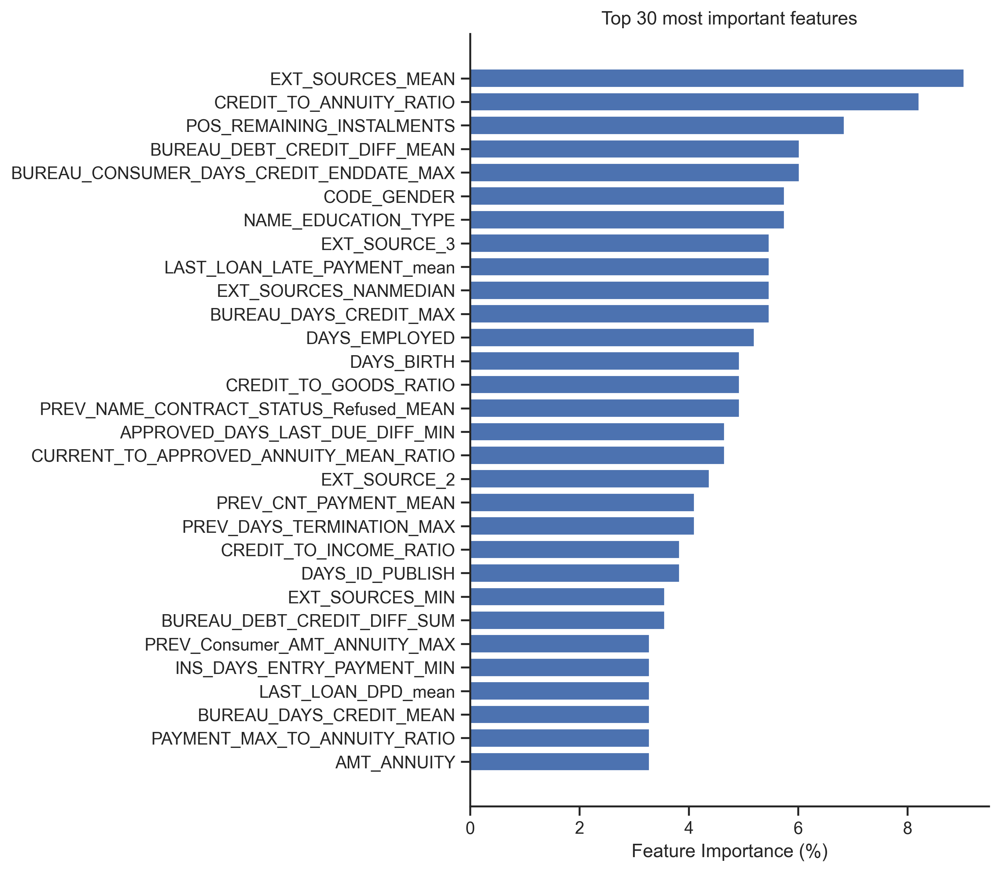

In [14]:
# Set the most influent features to show.
n_top_fts = 30

#model_pl_opt['model'].fit(X_TRAIN, y_TRAIN)

# Get the numpy array of the top features.
npa_top_fts = model_pl_opt['model'].feature_importances_.argsort()#[-n_top_fts:]


# Configure, plot and draw the figure.
plt.figure(figsize=(6,9), dpi=300)

plt.barh(X_TRAIN.columns[npa_top_fts[-n_top_fts:]], model_pl_opt['model'].\
         feature_importances_[npa_top_fts[-n_top_fts:]] / len(X_TRAIN.columns) * 100)

plt.xlabel("Feature Importance (%)")
plt.title("Top %i most important features" % n_top_fts)

plt.show()

### b) SHAP

SHAP present many advantages for our purpose:
- It can be used for local and global model interpretability. <br>
=> Better for consistancy and comparison between results obtain globally and locally.
- It offers intuitive grapgics to explain to non-experts which features influenced the most the predictions and how.


*__Technical annexes:__* <br>

Why SHAP over others ? https://towardsdatascience.com/interpretable-machine-learning-with-xgboost-9ec80d148d27

- doc 1: https://shap.readthedocs.io/en/latest/example_notebooks/api_examples/plots/bar.html
- doc 2: https://shap-lrjball.readthedocs.io/en/latest/generated/shap.dependence_plot.html

*NB: More about Kernel Explainer and its requirements for big datasets that Tree explainer bypasses:* https://colab.research.google.com/drive/1pjPzsw_uZew-Zcz646JTkRDhF2GkPk0N#scrollTo=SCOJFGMj3fq5

#### i. Library importation

In [15]:
import shap

shap.initjs()

#### ii. SHAP explanation

- Different explainers: https://snyk.io/advisor/python/shap/functions/shap.explainers.explainer.Explainer
- Background data or not & feature_perturbation = "interventional" or "tree_path_dependent" ? https://github.com/slundberg/shap/issues/1098 <br>
=> Background data: Closer to the model. <br>

*NB: According to the model (classifier or regressor) and the presence or not of background data, some graphics (such as shap.plots.bar()) won't behave the same way and might not be usable (for the classifiers mainly). Ex: shap.plots.bar can replaced by shap.plot_bar but such graphics are less detailed (as it can be noticed in a couple of cells below).*

In [16]:
%%time

# Select the number of the most important features to keep.
top_ft = 10

# Select the categorical class to base the explanations on (ex: 0 or 1 for binaries).
cat_class = 0

# Get the classifier and the scaler of the pipeline separatly.
# NB: Because the model type 'imblearn.pipeline.Pipeline' is not yet supported by TreeExplainer. 
#model_pl_label = 'scl_wt_lgbm_model_fine_opt'
#model_pl = df_MODELS.loc[model_pl_label]['Models']
#scaler = model_pl['scaler']
#clf = model_pl['Model']
scaler = model_pl_opt['scaler']
clf = model_pl_opt['model']

# Get the SHAP explanations of the observation.
explanations_global, delta_t, explainer_shap = interpretability_shap(clf, scaler,
                                                                     X_TRAIN, X_TEST,
                                                                     cat_class=cat_class)

# Get the average and the shap expected probabilities of the chosen class (1: postive, 0: negative).
yhat_mean = model_pl_opt.predict_proba(X_TRAIN).mean(axis=0)
yhat_shap_base_value_mean = explanations_global.base_values.mean(axis=0)

 99%|===================| 48492/48744 [01:44<00:00]        

CPU times: total: 1min 45s
Wall time: 1min 44s


In [17]:
# Summarize relevant values.
print("Model used:\n", clf)
print()
print("Model mean prediction probabilities on train data:", yhat_mean)
print()
print("Model mean proportions of the %i class predictions (=> Ratio of accepted applications (0) or denied (1)): %.3f" % (cat_class, yhat_mean[cat_class]))
print("SHAP expected mean proportions of the %s class predictions: %.3f" % (cat_class, yhat_shap_base_value_mean)) #explainer_shap.expected_value
print("SHAP explanation reliability index = %.3f" % (1 - abs(yhat_shap_base_value_mean - yhat_mean[cat_class])))
print()
print("Model prediction probabilities for the tested data:", model_pl_opt.predict_proba(X_TEST)[0])
print()
print("SHAP explainer run time:", round(delta_t, 2), "s")
print()

Model used:
 LGBMClassifier(class_weight='balanced', learning_rate=0.13, max_depth=90,
               min_child_weight=5, n_estimators=48, objective='binary',
               random_state=0, reg_alpha=0.0001, reg_lambda=1.0, subsample=0.9)

Model mean prediction probabilities on train data: [0.62819067 0.37180933]

Model mean proportions of the 0 class predictions (=> Ratio of accepted applications (0) or denied (1)): 0.628
SHAP expected mean proportions of the 0 class predictions: 0.596
SHAP explanation reliability index = 0.968

Model prediction probabilities for the tested data: [0.72662614 0.27337386]

SHAP explainer run time: 104.02 s



#### iii. Save the explainer

In [18]:
# Create or overwrite the SHAP explainer.
with open(os.path.join(SHAP_INTERPRETATIONS_DIR_PATH, 'explainer_shap.pkl'), "wb") as explainer_file:
    pickle.dump(explainer_shap, explainer_file)

#### iv. Interpretations

__- Mean absolute shapley values__

In [59]:
# Get the features sorted by SHAP importance.
global_features = pd.DataFrame(explanations_global.values, columns = X_TRAIN.columns).apply(lambda x: np.mean(abs(x))).sort_values(ascending=False)
global_features

EXT_SOURCES_MEAN                                             0.078150
CODE_GENDER                                                  0.027039
CREDIT_TO_GOODS_RATIO                                        0.020666
CREDIT_TO_ANNUITY_RATIO                                      0.020138
LAST_LOAN_LATE_PAYMENT_mean                                  0.020068
                                                               ...   
PREV_PRODUCT_COMBINATION_Cash_Street_low_MEAN                0.000000
INS_AMT_INSTALMENT_MEAN                                      0.000000
PREV_PRODUCT_COMBINATION_Cash_X_Sell_middle_MEAN             0.000000
PREV_PRODUCT_COMBINATION_POS_household_with_interest_MEAN    0.000000
NAME_CONTRACT_TYPE                                           0.000000
Length: 365, dtype: float64

In [60]:
# Get the threshold above which features can be considered very important for the model.
top_10_shap_value_thr = round(global_features[:10].values[-1], 3)
print("Features with an associated SHAP value beyond", top_10_shap_value_thr, "are in the Top 10.")

Features with an associated SHAP value beyond 0.013 are in the Top 10.


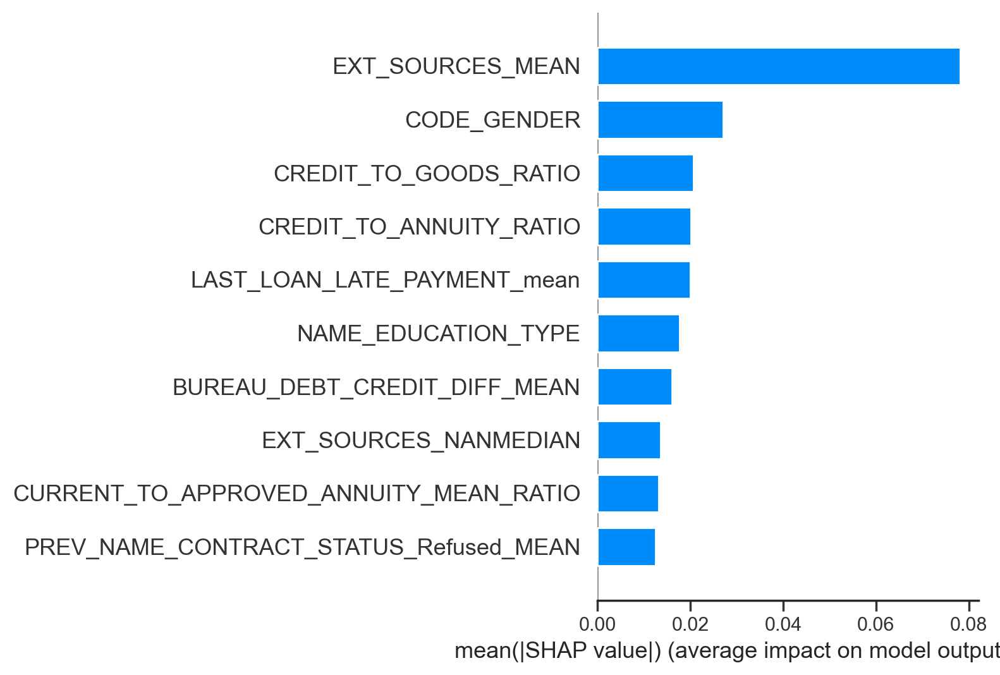

In [61]:
# Method 1:
shap.summary_plot(explanations_global, max_display=top_ft, plot_type='bar') #feature_names=X_TEST.columns,

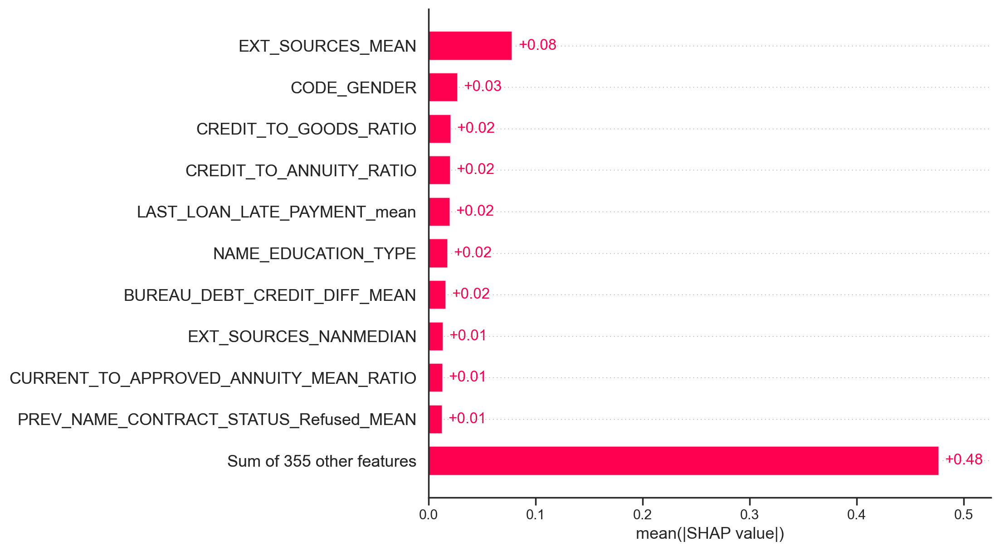

In [62]:
# Method 2 (with the absolute mean shapley values displayed):
# NB: As no feature_names parameter is present X_test_norm are reassociated with them in a df.
shap.plots.bar(explanations_global, max_display=top_ft+1)

In [63]:
# Method 3 (with the shapley values as text):
# Source: https://towardsdatascience.com/using-shap-values-to-explain-how-your-machine-learning-model-works-732b3f40e137

from scipy.special import softmax

def print_feature_importances_shap_values(shap_values, features):
    '''
    Prints the feature importances based on SHAP values in an ordered way
    shap_values -> The SHAP values calculated from a shap.Explainer object
    features -> The name of the features, on the order presented to the explainer
    '''
    # Calculates the feature importance (mean absolute shap value) for each feature
    importances = []
    for i in range(shap_values.values.shape[1]):
        importances.append(np.mean(np.abs(shap_values.values[:, i])))
    # Calculates the normalized version
    importances_norm = softmax(importances)
    # Organize the importances and columns in a dictionary
    feature_importances = {fea: imp for imp, fea in zip(importances, features)}
    feature_importances_norm = {fea: imp for imp, fea in zip(importances_norm, features)}
    # Sorts the dictionary
    feature_importances = {k: v for k, v in sorted(feature_importances.items(), key=lambda item: item[1], reverse = True)}
    feature_importances_norm= {k: v for k, v in sorted(feature_importances_norm.items(), key=lambda item: item[1], reverse = True)}
    # Prints the feature importances
    for k, v in feature_importances.items():
        print(f"{k} -> {v:.4f} (softmax = {feature_importances_norm[k]:.4f})")
        
print_feature_importances_shap_values(explanations_global, X_TEST.columns)

EXT_SOURCES_MEAN -> 0.0782 (softmax = 0.0030)
CODE_GENDER -> 0.0270 (softmax = 0.0028)
CREDIT_TO_GOODS_RATIO -> 0.0207 (softmax = 0.0028)
CREDIT_TO_ANNUITY_RATIO -> 0.0201 (softmax = 0.0028)
LAST_LOAN_LATE_PAYMENT_mean -> 0.0201 (softmax = 0.0028)
NAME_EDUCATION_TYPE -> 0.0177 (softmax = 0.0028)
BUREAU_DEBT_CREDIT_DIFF_MEAN -> 0.0160 (softmax = 0.0028)
EXT_SOURCES_NANMEDIAN -> 0.0136 (softmax = 0.0028)
CURRENT_TO_APPROVED_ANNUITY_MEAN_RATIO -> 0.0133 (softmax = 0.0028)
PREV_NAME_CONTRACT_STATUS_Refused_MEAN -> 0.0125 (softmax = 0.0028)
BUREAU_CONSUMER_DAYS_CREDIT_ENDDATE_MAX -> 0.0112 (softmax = 0.0028)
DAYS_BIRTH -> 0.0102 (softmax = 0.0028)
DAYS_EMPLOYED -> 0.0099 (softmax = 0.0028)
POS_REMAINING_INSTALMENTS -> 0.0098 (softmax = 0.0028)
EXT_SOURCE_3 -> 0.0094 (softmax = 0.0028)
PREV_CNT_PAYMENT_MEAN -> 0.0088 (softmax = 0.0028)
BUREAU_CONSUMER_AMT_CREDIT_SUM_MEAN -> 0.0087 (softmax = 0.0028)
APPROVED_DAYS_LAST_DUE_DIFF_MIN -> 0.0085 (softmax = 0.0028)
INS_SIGNIFICANT_LATE_PAYMENT_SUM

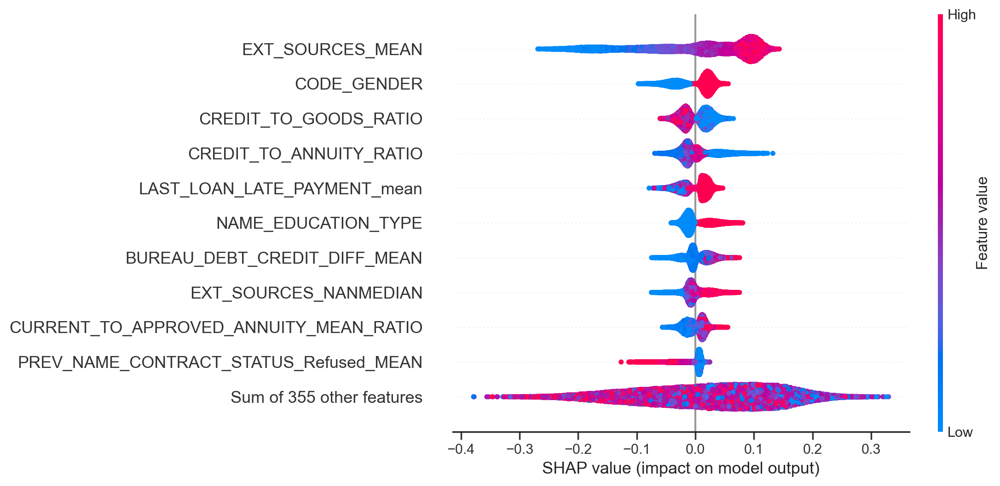

In [64]:
# Method 4 (Beeswarm):
# NB: Equivalent plot: shap.summary_plot(explanations, X_test_norm, feature_names=X_TEST.columns, max_display=top_ft, plot_type='dot')
shap.plots.beeswarm(explanations_global, max_display=top_ft+1)

__- Features' influences and dependences__

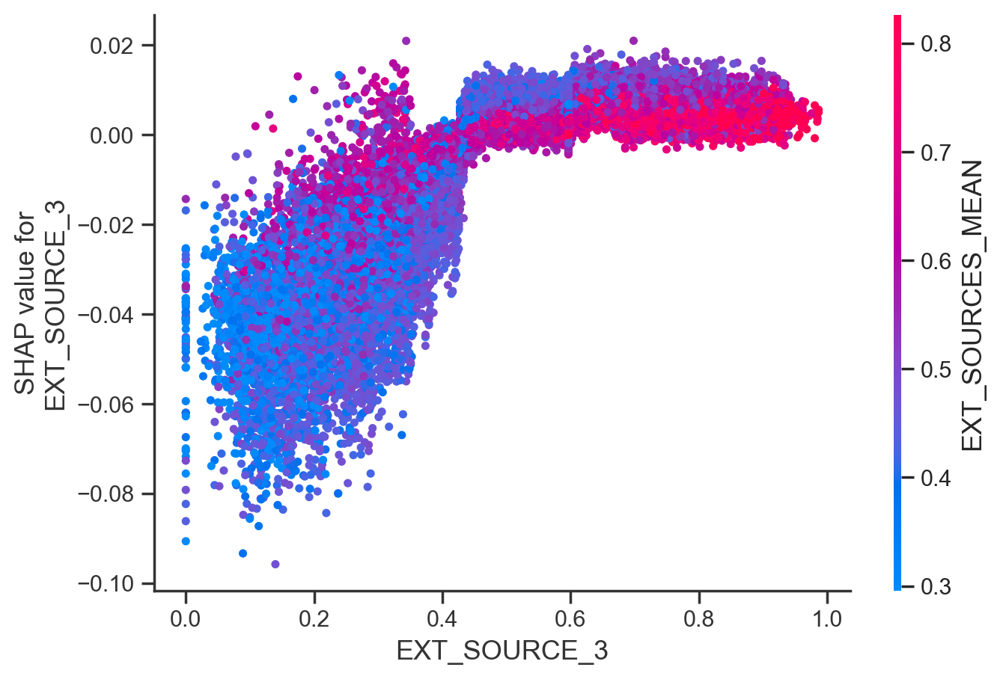

In [65]:
# Detail features influences on predictions.
X_test_norm = pd.DataFrame(scaler.transform(X_TEST), columns=X_TEST.columns)
shap.dependence_plot('EXT_SOURCE_3', explanations_global.values, X_test_norm, interaction_index='EXT_SOURCES_MEAN') #feature_names=X_TEST.columns

#### v. Save global interpretations

In [66]:
# Create or overwrite the file containing the SHAP explanations.
with open(os.path.join(SHAP_INTERPRETATIONS_DIR_PATH, 'global_shap_explanations.pkl'), "wb") as explanations_global_file:
    pickle.dump(explanations_global, explanations_global_file)

## 2) Local

*NB: A random customer who saw its demand denied by the model will be used as an example to simulate a situation in which the communication officer should explain him the reasons of its reject.*

### a) SHAP

#### i. Show customers IDs with a denied recommendation

In [67]:
# Show customers row index which corresponds to denied application.
print("Sample of customers row indexes which corresponds to denied applications (Index [yhat_N, yhat_P]):")

n_bad_ids = 0
for i, idx in enumerate(range(len(model_pl_opt.predict_proba(X_test_norm)))):
    if model_pl_opt.predict_proba(X_test_norm)[i][0] < 0.3:
        print(idx, model_pl_opt.predict_proba(X_test_norm)[i])
        n_bad_ids += 1
        
        # Break the loop after the set number of denied IDs printed to go faster.
        if n_bad_ids > 20:
            print("Limit reached => Loop broken.")
            break

Sample of customers row indexes which corresponds to denied applications (Index [yhat_N, yhat_P]):
9 [0.21090611 0.78909389]
23 [0.29792958 0.70207042]
26 [0.28330227 0.71669773]
39 [0.28346812 0.71653188]
73 [0.27799696 0.72200304]
74 [0.16499188 0.83500812]
87 [0.12438799 0.87561201]
94 [0.2106745 0.7893255]
97 [0.28749533 0.71250467]
114 [0.23439735 0.76560265]
128 [0.24827809 0.75172191]
129 [0.28150849 0.71849151]
139 [0.16661675 0.83338325]
155 [0.20431451 0.79568549]
157 [0.17312787 0.82687213]
163 [0.27380343 0.72619657]
172 [0.29630188 0.70369812]
175 [0.27562296 0.72437704]
179 [0.12056893 0.87943107]
190 [0.25081468 0.74918532]
202 [0.12044738 0.87955262]
Limit reached => Loop broken.


#### ii. SHAP explanation

In [68]:
# Select the customer to observe by its ID.
customer_id = df_test.index[139] #118485 #118464

# Select the number of the most important features to show.
top_ft = 10

# Select the categorical class to base the explanations on (ex: 0 or 1 for binaries).
cat_class = 0

# Get the classifier and the scaler of the pipeline.
#model_pl_label = 'scl_wt_lgbm_model_fine_opt'
#model_pl = df_MODELS.loc[model_pl_label]['Models']
#scaler = model_pl['scaler']
#clf = model_pl['model']
scaler = model_pl_opt['scaler']
clf = model_pl_opt['model']

# Get the corresponding customer index within the df or numpy array.
#customer_df_idx = list(df_test.index).index(customer_id)

# Get the SHAP explanations of the observation.
explanations_local, delta_t, _ = interpretability_shap(clf, scaler,
                                                    X_TRAIN, X_TEST.loc[[customer_id]],
                                                    cat_class=cat_class)

# Get the average and the shap expected probabilities of the chosen class (1: postive, 0: negative).
yhat_mean = model_pl_opt.predict_proba(X_TRAIN).mean(axis=0)
yhat_shap_base_value_mean = explanations_local.base_values.mean(axis=0)

In [69]:
#test = interpretability_shap_prod(X_TEST.loc[[customer_id]],
#                                                         scaler,
#                                                         explainer_shap,
#                                                         cat_class=cat_class)

In [70]:
# Summarize relevant values.
print("Model used:\n", clf)
print()
print("Model mean prediction probabilities on train data:", yhat_mean)
print()
print("Model mean proportions of the %i class predictions (=> Ratio of accepted applications (0) or denied (1)): %.3f" % (cat_class, yhat_mean[cat_class]))
print("SHAP expected mean proportions of the %s class predictions: %.3f" % (cat_class, yhat_shap_base_value_mean)) #explainer_shap.expected_value
print("SHAP explanation reliability index = %.3f" % (1 - abs(yhat_shap_base_value_mean - yhat_mean[cat_class])))
print()
print("Model prediction probabilities for the tested data:", model_pl_opt.predict_proba(X_TEST.loc[[customer_id]])[0])
print()
print("SHAP explainer run time:", round(delta_t, 2), "s")
print()

Model used:
 LGBMClassifier(class_weight='balanced', learning_rate=0.13, max_depth=90,
               min_child_weight=5, n_estimators=48, objective='binary',
               random_state=0, reg_alpha=0.0001, reg_lambda=1.0, subsample=0.9)

Model mean prediction probabilities on train data: [0.62819067 0.37180933]

Model mean proportions of the 0 class predictions (=> Ratio of accepted applications (0) or denied (1)): 0.628
SHAP expected mean proportions of the 0 class predictions: 0.596
SHAP explanation reliability index = 0.968

Model prediction probabilities for the tested data: [0.26437677 0.73562323]

SHAP explainer run time: 0.04 s



#### iii. Interpretations

__- Mean absolute shapley values__

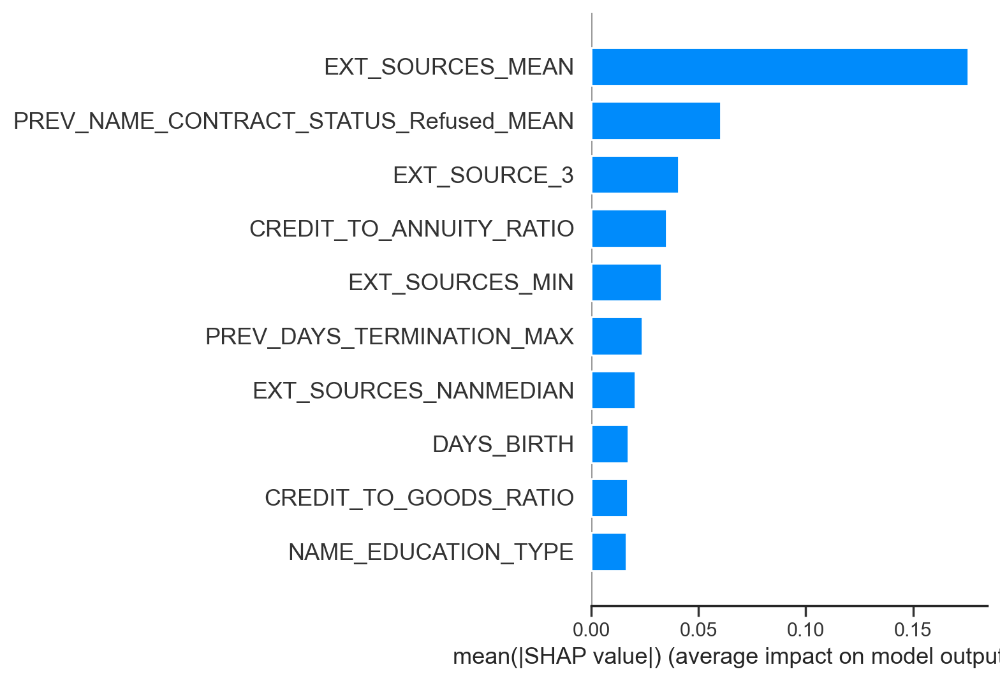

In [71]:
# Method 1:
shap.summary_plot(explanations_local, max_display=top_ft, plot_type='bar') #feature_names=X_TEST.columns,

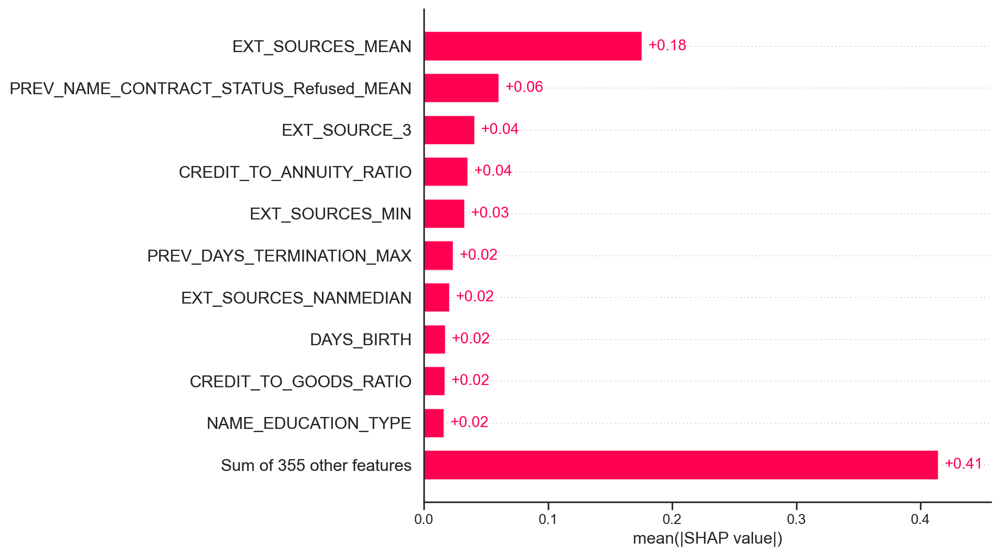

In [72]:
# Method 2 (with the absolute mean shapley values displayed):
# NB: As no feature_names parameter is present X_test_norm are reassociated with them in a df.
shap.plots.bar(explanations_local, max_display=top_ft+1)

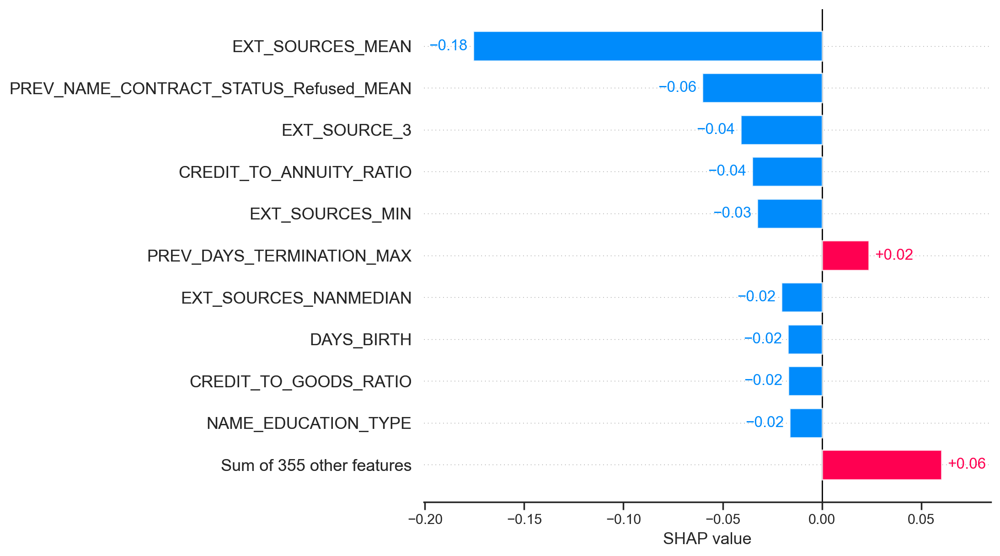

In [73]:
# Method 3 (with the mean shapley values displayed):
# NB: As no feature_names parameter is present X_test_norm are reassociated with them in a df.
shap.plots.bar(explanations_local[0], max_display=top_ft+1)

__- Force plots__

*NB: Those figures will be used to explain to customers what led the model to accept or refuse their demands of credit.*

In [74]:
### Shape 1: Condensed ###

# NB1: f(x) scale coorresponds to the log odd (=> It shoud be <= 0 for positive ).
#      => In order to get the corresponding probability P = 10^(log odd value).
# NB2: .force_plot() seems to be the same as .plots.force().
#shap.plots.force(explainer_shap.expected_value[1], explanations[1], X_test_norm_sp, feature_names=X_TEST.columns)
shap.plots.force(explanations_local[0])

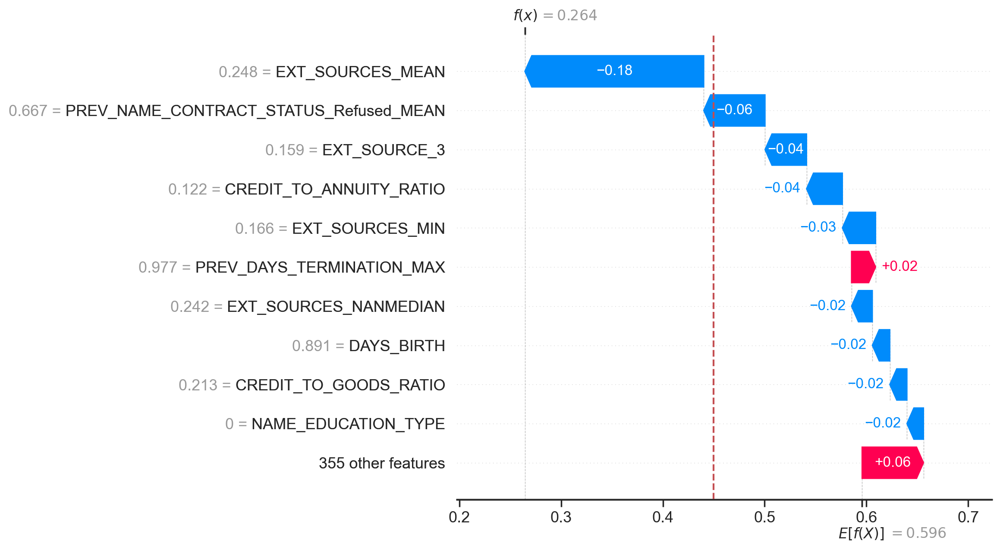

In [75]:
### Shape 2: Detailed ###

# Transform the log odds default model values to their odd counterpart which
# is an easier scale to interpret for none professional people.
# NB: The argument "show=False" allows to not display the graph immediately in order to allows further customization with
#     matplotlib or seaborn or other... before displaying the graph with a "plt.show()".
shap.plots.waterfall(explanations_local[0], top_ft+1, show=False)  
plt.axvline(x=df_models_sum.loc['scl_wt_lgbm_clf_fine_opt', 'Best_proba_threshold_train'], color='r', linestyle='--') # Show the classification threshold limit on the figure.

plt.show()

At the end, it is clear that EXT_SOURCES_MEAN is the feature which influenced the prediction the most. <br>
=> The customer knows what he should plays on to see its application accepted next time. <br>

*Personal comment: However, customers cannot always play over the most important features and a simplifying system only based over passed fact and actions which does not consider what drove the person to act as he did, can also lead to constant denying applications of someone which lives in a different situation now and would completely repay its credit. Furthermore, auto iterative features such as "previsouly accepted or denied applications" should perhaps be ignored since it can lead to a loop of constant denies or acceptances regardless of the real situation of the customer. <br>
=> Anyone should keep in mind that this kind of algorithm remains a tool and not the word of god. He/she then should carefully study the application before taking his decision as it can seriously impact the whole life of the person in front and not rely exclusively on the model's predictions. Recommendations which are, unfortunately, not applied in many (most?) cases...*

# III) Data drift analysis: Evidently

In order to save time and increase the reliability of the analysis, the data drift study is made over the most important features (features with an associated gloval shapley value above 0.1 %). <br>
=> Different thresholds would give different results.

## 1) Additional importation

### a) Libraries

In [76]:
import json

import evidently

from evidently.report import Report
from evidently.metric_preset import DataDriftPreset#, TargetDriftPreset, DataQualityPreset, RegressionPreset
from evidently.metrics import *

### b) Global path

In [77]:
EXPORTS_DATA_DRIFT_DIR_PATH = r'Exports\Data_drift'

## 2) Functions

In [78]:
def jprint (json_text, indent=4, sort_keys=False):
    
    """ Print a python dictionary in a json more readable format. """
    
    # Creates a better formatted string than the default python JSON text.
    json_text_printable = json.dumps(json_text, indent=indent, sort_keys=sort_keys) # NB: sort_keys sorts all elements of the JSON from top to bottom or the reverse.
    print(json_text_printable)

## 3) Data drift between the dataset of new customers and the train set

### a) Evidently report

In [79]:
# Get the number of most important features to check for the model.
n_top_fts = len((global_features[global_features >= 0.001]))

# Get the most important features labels.
global_top_fts_labels = global_features.to_frame().index[:n_top_fts]

In [80]:
%%time

# Data drift summary (report).
report_current = Report(metrics=[DataDriftPreset()])
report_current.run(reference_data=X_TRAIN.reset_index(drop=True)[global_top_fts_labels],
                   current_data=X_TEST.reset_index(drop=True)[global_top_fts_labels])

CPU times: total: 18min 35s
Wall time: 18min 35s


In [81]:
# Show the report.
report_current

By default the cumulated data drift threshold is set to 50 % over all features which drifted but it can be lowered or highered as will. It is also possible to adjust the threshold at which a feature is considered as drifted (5 % by default). <br>
What is important notice is the propotion of cumulated drifted features which reached ~18 % in our case. <br>
=> ~15-20 % of data drift in our configuration can be considered as normal and would not require a recalibration.

*NB: Reduction of the delay before accept or deny an application may allows to reduce data drift.*

### b) Report storage

In [82]:
# Create or overwrite the file containing the report.
with open(os.path.join(EXPORTS_DATA_DRIFT_DIR_PATH, 'evidently_report.pkl'), "wb") as report_file:
    pickle.dump(report_current, report_file)

# Save the report as an html file.
report_current.save_html(os.path.join(EXPORTS_DATA_DRIFT_DIR_PATH, 'evidently_report.html'))

In [83]:
# Load the report from the storage file.
with open(os.path.join(EXPORTS_DATA_DRIFT_DIR_PATH, 'evidently_report.pkl'), "rb") as report_file:
    report_current = pickle.load(report_file)

### c) SHAP values of features with significant data drift
This will allow to see if drifting features are important or negligeable input for the model.

In [84]:
def highlight_top_features (df, shap_value_thr):
        
    """ Highlight the most important features for the model. """
    
    # NB: Color the text in black if an else is reqiured tu fill white spaces (color: #000000).
    return ['background-color: salmon' if df.iloc[i] >= shap_value_thr else '' for i in range(df.shape[0])] # Red color: #E8000B

In [85]:
# Get a look at the structure of the evidently report.
jprint(report_current.as_dict())

{
    "metrics": [
        {
            "metric": "DatasetDriftMetric",
            "result": {
                "drift_share": 0.5,
                "number_of_columns": 147,
                "number_of_drifted_columns": 27,
                "share_of_drifted_columns": 0.1836734693877551,
                "dataset_drift": false
            }
        },
        {
            "metric": "DataDriftTable",
            "result": {
                "number_of_columns": 147,
                "number_of_drifted_columns": 27,
                "share_of_drifted_columns": 0.1836734693877551,
                "dataset_drift": false,
                "drift_by_columns": {
                    "AMT_ANNUITY": {
                        "column_name": "AMT_ANNUITY",
                        "column_type": "num",
                        "stattest_name": "Wasserstein distance (normed)",
                        "stattest_threshold": 0.1,
                        "drift_score": 0.15994964726112149,
                   

In [89]:
# Get the section in which search in report.
search_section = report_current.as_dict()['metrics'][1]['result']['drift_by_columns']

# Get the list of features with significant data drift.
l_drift_features = [feature for feature in search_section.keys() if search_section[feature]['drift_detected']]

# Check the shap values of features with significant data drift.
print("SHAP values of features with significant data drift:")
df_shap_values_drifted_features = global_features[l_drift_features].to_frame().rename({0: 'absolute_shap_values'}, axis='columns')

# Set the dataframe style in order to highlight top features for the model which drifted.
df_shap_values_drifted_features = df_shap_values_drifted_features.style.apply(highlight_top_features, shap_value_thr=top_10_shap_value_thr)
df_shap_values_drifted_features

SHAP values of features with significant data drift:


,absolute_shap_values
AMT_ANNUITY,0.005307
AMT_CREDIT,0.005097
AMT_GOODS_PRICE,0.004749
APPROVED_CNT_PAYMENT_MEAN,0.002152
APPROVED_CREDIT_TO_ANNUITY_RATIO_MAX,0.001071
APPROVED_CREDIT_TO_ANNUITY_RATIO_MEAN,0.001771
APPROVED_DAYS_LAST_DUE_1ST_VERSION_MAX,0.001798
BUREAU_MONTHS_BALANCE_SIZE_SUM,0.002563
CREDIT_TO_ANNUITY_RATIO,0.020138
CREDIT_TO_GOODS_RATIO,0.020666


## 4) Simulation of the data drift overtime (Made over the train set)

Now we will focus on estimating data drift overtime.

### a) Functions

In [43]:
def select_time_period (df, range_limit_min = 0, range_limit_max = 0, time_period_col = 'DAYS_REGISTRATION'):
    
    """
    Description
    -----------
    Reduce the dataframe in the desired time period partition.
    
    Parameters
    ----------
    df: pandas.Dataframe()
        Dataframe to process.
    time_period_col: str
        Column's name in which to get the datetimes.

    Return: pandas.DataFrame()
    ------
    Returns the selected partition.
        
    """
          
    # Get the partition.
    df = df[(df[time_period_col] <= -range_limit_min * 365.25) &
            (df[time_period_col] >= -range_limit_max * 365.25)]
    
    # Display the partition datetime's range.
    print("Partition period: [%.2f, %.2f] => %.2f" %
          (abs(df['DAYS_REGISTRATION'].min() / 365.25), 
           abs(df['DAYS_REGISTRATION'].max() / 365.25),
           abs(df['DAYS_REGISTRATION'].min() / 365.25) - abs(df['DAYS_REGISTRATION'].max() / 365.25)),
          "years"
         )
    print("Number of customers within the partition:", df.shape[0])
   
    return df

### b) Simulation

In [44]:
# Get the mean number of days per year.
mean_days_per_month = np.mean([31]*7 + [30]*4 + [28])

# Get the total period of time the train set covers.
total_period_range = round(abs(X_TRAIN['DAYS_REGISTRATION'].min() / 365.25), 2)
print("Longest registered customer of the train set:", round(abs(X_TRAIN['DAYS_REGISTRATION'].min() / 365.25), 2), "years")
print("Shortest registered customer of the train set:", abs(X_TRAIN['DAYS_REGISTRATION'].max()), "day")
print("Total period range:", round(abs(X_TRAIN['DAYS_REGISTRATION'].min() / 365.25), 2), "years")

Longest registered customer of the train set: 57.08 years
Shortest registered customer of the train set: 0 day
Total period range: 57.08 years


In [45]:
%%time

# Set time periods.
period_start = 20 # Period of the reference. NB: in order to get enough customers as reference.
period_step = 2 # Period of time between each data drift test.

# Get the oldest registration time of the train set.
oldest_registration = abs(X_TRAIN['DAYS_REGISTRATION'].min() / 365.25)

# Selected reference partition within the train set.
count = 0 # Give a number to each partition.
print("- Reference partition #%i:" % count)
partition_ref = select_time_period(X_TRAIN, oldest_registration - period_start, oldest_registration)
print()

# Initialize the evidently data drift report.
#report_simulation = Report(metrics=[DataDriftPreset(cat_stattest='ks', drift_share=0.33)]) #cat_statest_threshold=0.05,

l_reports = []
#l_reports_periods = []
l_n_drifted_features = []
drift_share = 0.33 # Proportion of the global drift.
l_periods = abs(np.arange(-oldest_registration + period_start, period_step, period_step) + oldest_registration - period_start)
for period in l_periods:
    
    # Set the low limit of the period range to consider.
    range_limit_min = oldest_registration - period_start - period
    range_limit_max = oldest_registration #- period # NB: Commenting or not this row allows to take into account the previous partitions into the new one or not.

    # Selected current test partition within the test set.
    print("- Current partition #%i:" % count)
    partition_curr = select_time_period(X_TRAIN, range_limit_min, range_limit_max)
    
    # Data drift summary (report).
    # NB: Report is re-initialize at each iteration for easier management and display of the HTML table.
    report_simulation = Report(metrics=[DataDriftPreset(cat_stattest='ks', drift_share=drift_share)]) #cat_statest_threshold=0.05,
    report_simulation.run(reference_data=partition_ref.reset_index(drop=True)[global_top_fts_labels],
                          current_data=partition_curr.reset_index(drop=True)[global_top_fts_labels])
    
    # Get the number of detected drifted features for the partition.
    l_reports.append(([range_limit_min, range_limit_max], report_simulation))
    #l_reports_periods.append((range_limit_min, range_limit_max))
    l_n_drifted_features.append(report_simulation.as_dict()['metrics'][0]['result']['number_of_drifted_columns']) #[0] => [count]
    print("Number of drifted features found:", l_n_drifted_features[count])
    
    # Update the partition number.
    count += 1
    
    print()
    
print("Number of drifted features found all over the full simulation period:\n", l_n_drifted_features)
print()

- Reference partition #0:
Partition period: [57.08, 37.08] => 20.00 years
Number of customers within the partition: 933

- Current partition #0:
Partition period: [57.08, 37.08] => 20.00 years
Number of customers within the partition: 933
Number of drifted features found: 0

- Current partition #1:
Partition period: [57.08, 35.09] => 21.99 years
Number of customers within the partition: 1677
Number of drifted features found: 3

- Current partition #2:
Partition period: [57.08, 33.10] => 23.98 years
Number of customers within the partition: 2659
Number of drifted features found: 12

- Current partition #3:
Partition period: [57.08, 31.08] => 26.00 years
Number of customers within the partition: 3803
Number of drifted features found: 20

- Current partition #4:
Partition period: [57.08, 29.09] => 27.99 years
Number of customers within the partition: 5416
Number of drifted features found: 45

- Current partition #5:
Partition period: [57.08, 27.09] => 29.98 years
Number of customers withi

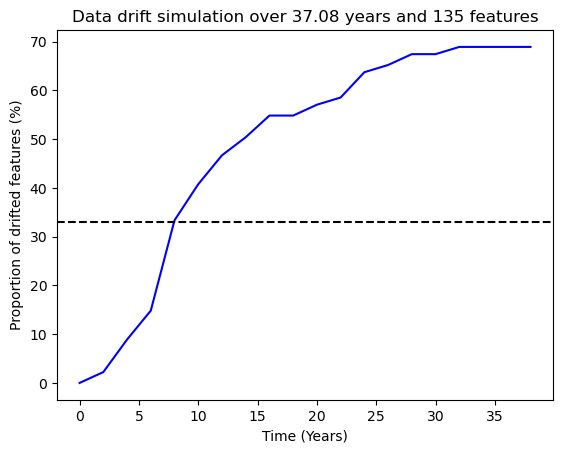

In [46]:
# Draw the figure of the simulated data drift overtime.
plt.plot(l_periods, (np.array(l_n_drifted_features) / n_top_fts * 100), color='b')
plt.title("Data drift simulation over %.2f years and the %i most important features" % ((total_period_range - period_start), n_top_fts))
plt.xlabel("Time (Years)")
plt.ylabel("Proportion of drifted features (%)") #"Number of drifted features"
#plt.axhline(drift_share * 100, color='k', linestyle='--')
plt.show()

It can be noticed that the largest drifts are observed among the 10 first years, to reach 33 % of drifted features, before starting to slowly stabilize. <br>
=> A maintenance within the 10 first years should be considered.

*NB: It has to be kept in mind that more there are drifted features more features left are actually resilient and less numerous reducing chances of new drifts overtime too. <br>
=> Interpretations should be considered with care as we observe results further and further front in time.*

### c) Results

#### i. Shows the HTML table of the report corresponfing to the selected year

In [64]:
# Select the year corresponding the detection of the dataset drift.
select_year = 7

# Display the correpsonding HTML table.
l_reports[int(round(select_year / period_step, 0))][1]
#report_simulation

#### ii. Checking the importance of the drifted features

In [65]:
# Get the section in which search in report.
search_section = l_reports[int(round(select_year / period_step, 0))][1].as_dict()['metrics'][1]['result']['drift_by_columns']

# Get the list of features with significant data drift.
l_drift_features = [feature for feature in search_section.keys() if search_section[feature]['drift_detected']]

# Check the shap values of features with significant data drift.
print("SHAP values of the %i features with a significant data drift after %.2f" % (len(l_drift_features), select_year), "years.")
df_shap_values_drifted_features = global_features[l_drift_features].sort_values(ascending=False).to_frame().rename({0: 'absolute_shap_values'}, axis='columns')

# Set the dataframe style in order to highlight top features for the model which drifted.
df_shap_values_drifted_features = df_shap_values_drifted_features.style.apply(highlight_top_features, shap_value_thr=top_10_shap_value_thr)
df_shap_values_drifted_features

SHAP values of the 45 features with a significant data drift after 7.00 years.


,absolute_shap_values
EXT_SOURCES_MEAN,0.048882
EXT_SOURCES_NANMEDIAN,0.039095
CODE_GENDER,0.030552
NAME_EDUCATION_TYPE,0.017008
EXT_SOURCES_MIN,0.013527
DAYS_EMPLOYED,0.011568
PREV_LAST24M_APPLICATION_CREDIT_DIFF_MIN,0.011452
AMT_ANNUITY,0.010585
FLAG_OWN_CAR,0.009798
DAYS_BIRTH,0.009569


It can observed that between 6 and 7 years, the total proportion of drifted features almost doubles and most of the Top 10 features are now drifted (3 to 7). It can also be observed that between those 2 years data drift from 15 % to 33 %. <br>
=> From these observations, I would recommend to plan first maintenance between 6 - 7 years around 25 % data drift. 